# オーディオを扱う準備

オーディオのプログラミングには、オーディオ・インターフェースを介した入出力、オーディオ・データをいろいろに加工する信号処理、オーディオ・ファイルからの読み込み・書き出し、の3つの部分から構成されます。ここではファイルからオーディオ信号を読み込み、周波数分析を行ってみます。

In [1]:
using FileIO: load, save
import LibSndFile      # 音ファイルの読み書きに使う
using SampledSignals   # オーディオサンプルの定義
using FFTW             # FFTのため
using Plots            # グラフ描画に使う
pyplot();

In [2]:
x = load("recorder.flac")

352800-frame, 1-channel SampleBuf{FixedPointNumbers.Fixed{Int16,15}, 2}
8.0s sampled at 44100.0Hz
▁▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▂▁▁▁▁▁▁▁▁▁▁▁▁▅▅▅▅▅▆▆▆▆▆▆▆▆▆▆▆▆▅▁▁▁▁▁▁▁▁▁▁▁▅▅▆▆▆▆▆▆▆▆▆▆▆▆▆▆▆▅▁▁▁

In [3]:
x.samplerate   # サンプリング周波数

44100.0

In [4]:
x.data

352800×1 Array{Q0f15,2} with eltype FixedPointNumbers.Fixed{Int16,15}:
 -3.0e-5Q0f15 
  6.0e-5Q0f15 
 -9.0e-5Q0f15 
  0.00012Q0f15
 -0.00015Q0f15
  0.00015Q0f15
 -0.00012Q0f15
  6.0e-5Q0f15 
  0.0Q0f15    
 -3.0e-5Q0f15 
  3.0e-5Q0f15 
  0.0Q0f15    
  0.0Q0f15    
 -3.0e-5Q0f15 
  0.0Q0f15    
  6.0e-5Q0f15 
 -6.0e-5Q0f15 
  6.0e-5Q0f15 
 -3.0e-5Q0f15 
 -6.0e-5Q0f15 
  0.00012Q0f15
 -0.00012Q0f15
  9.0e-5Q0f15 
 -6.0e-5Q0f15 
  6.0e-5Q0f15 
 -6.0e-5Q0f15 
  3.0e-5Q0f15 
  0.0Q0f15    
 -3.0e-5Q0f15 
  ⋮           
 -3.0e-5Q0f15 
  9.0e-5Q0f15 
 -0.00015Q0f15
  0.00018Q0f15
 -0.00018Q0f15
  0.00015Q0f15
 -9.0e-5Q0f15 
  3.0e-5Q0f15 
 -3.0e-5Q0f15 
  6.0e-5Q0f15 
 -3.0e-5Q0f15 
  0.0Q0f15    
 -3.0e-5Q0f15 
  6.0e-5Q0f15 
 -9.0e-5Q0f15 
  0.00018Q0f15
 -0.00027Q0f15
  0.00027Q0f15
 -0.00024Q0f15
  0.00021Q0f15
 -0.00012Q0f15
  6.0e-5Q0f15 
 -3.0e-5Q0f15 
 -6.0e-5Q0f15 
  0.00012Q0f15
 -0.00012Q0f15
  0.00012Q0f15
 -9.0e-5Q0f15 

In [5]:
x[1:44100, :]

44100-frame, 1-channel SampleBuf{FixedPointNumbers.Fixed{Int16,15}, 2}
1.0s sampled at 44100.0Hz
▁▁▁▁▁▁▁▁▃▄▄▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅▅

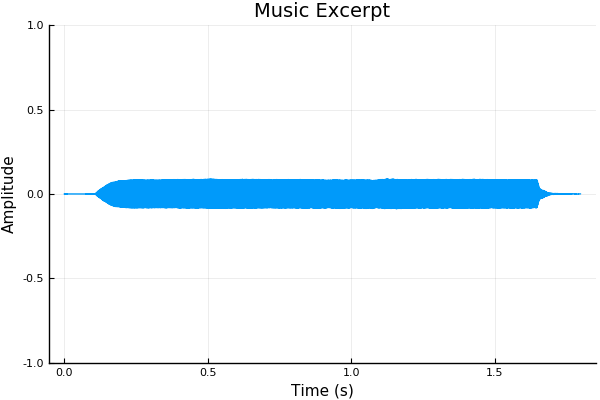

In [24]:
x1 = x.data[1:round(Int, 1.8*fs), 1];   # チャンネル1のみ抜き出し
t = (0 : length(x1)-1) / x.samplerate;
plot(t, x1, ylim=(-1, +1), title="Music Excerpt", xlabel="Time (s)", ylabel="Amplitude", legend=false)

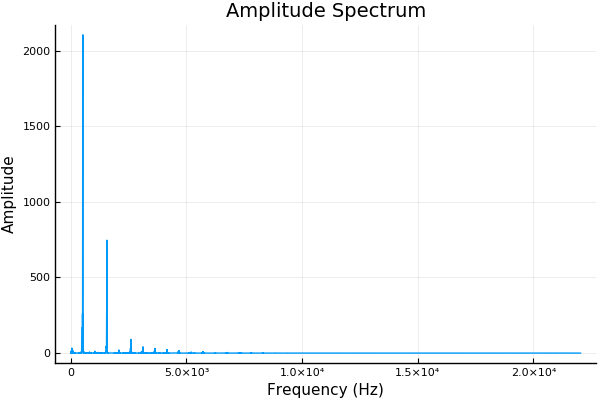

In [35]:
X1 = abs.(fft(x1));
X2 = X1[1 : round(Int, length(X1)/2 + 1)];
X2[2:end-1] = X2[2:end-1] * 2.0;
f = range(0, stop=x.samplerate/2, length=length(X2));
plot(f, X2,
    title="Amplitude Spectrum", xlabel="Frequency (Hz)", ylabel="Amplitude", legend=false)

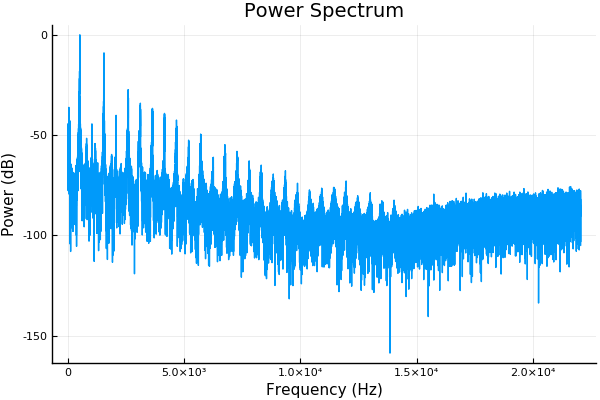

In [36]:
plot(f, 20*log10.(X2 / maximum(X2)),
    title="Power Spectrum", xlabel="Frequency (Hz)", ylabel="Power (dB)", legend=false)

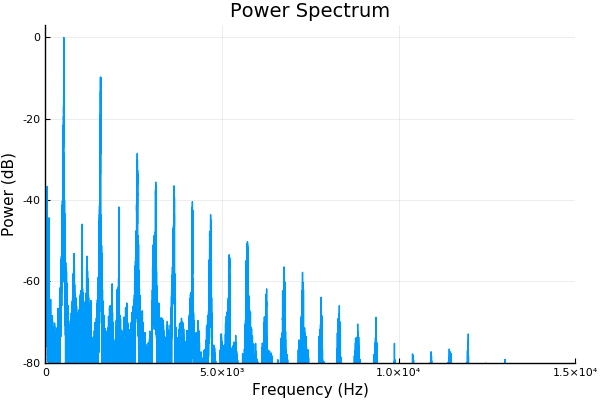

In [50]:
y = load("recorder.flac");
fs = y.samplerate;
y1 = y[1:Int(fs*1.8)];
y2 = zeros(nextpow(2, length(y1)));
y2[1:length(y1)] = y1;
Y2 = abs.(fft(y2));
Y2 = Y2 / length(y2);
Y2 = Y2 .^ 2;
Y3 = Y2[1 : Int(length(Y2)/2) + 1];
Y3[2:end-1] = Y3[2:end-1] * 2.0;
Y4 = 10*log10.(Y3);

f = range(0, stop=y.samplerate/2, length=length(Y3));
plot(f, Y4 .- maximum(Y4),
    xlim=(0, 15000), ylim=(-80, +3),
    title="Power Spectrum", xlabel="Frequency (Hz)", ylabel="Power (dB)",
    #xtick=([31.5, 63, 125, 250, 500, 1000, 2000, 4000, 8000, 16000],
    #    ["31.5", "63", "125", "250", "500", "1k", "2k", "4k", "8k", "16k"]),
    legend=false)

In [10]:
# writing sound file
whitenoise = rand(44100, 4) .- 0.5;
testbuf = SampleBuf(whitenoise, x.samplerate);
save("hoge.wav", testbuf);

# FLAC requires samples to be PCM16Sample
arr = map(PCM16Sample, whitenoise);
testbuf = SampleBuf(arr, x.samplerate);
save("hoge.flac", testbuf);